In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
pd.set_option('display.max_rows', 100)

In [3]:
columns = ['age', 'workclass', 'fnlwgt', 'education', 'educational_num', 'marital_status', 
           'occupation', 'relationship', 'race', 'sex', 'capital_gain', 'capital_loss',
           'hours_per_week', 'native_country', 'target']

In [4]:
df_train = pd.read_csv('/home/guillaume/code/GGIML/vivadata-student/data/adults/adult.data', names = columns, na_values=' ?')
df_test = pd.read_csv('/home/guillaume/code/GGIML/vivadata-student/data/adults/adult.test', names = columns, na_values=' ?')

In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              32561 non-null  int64 
 1   workclass        30725 non-null  object
 2   fnlwgt           32561 non-null  int64 
 3   education        32561 non-null  object
 4   educational_num  32561 non-null  int64 
 5   marital_status   32561 non-null  object
 6   occupation       30718 non-null  object
 7   relationship     32561 non-null  object
 8   race             32561 non-null  object
 9   sex              32561 non-null  object
 10  capital_gain     32561 non-null  int64 
 11  capital_loss     32561 non-null  int64 
 12  hours_per_week   32561 non-null  int64 
 13  native_country   31978 non-null  object
 14  target           32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


We can see that there are some missing values in the dataset that we will have to tackle. Some columns are object-type and we should deal with them to have numerical columns. We notice educational has a column educational_num. This column is ordered so it does not mean anything. We should start from the educational column and dummifiy it directly.

## EDA

### Let's do some exploratory analysis

In [6]:
px.histogram(df_train, x='age')

In [7]:
px.histogram(df_train, x='target')

The target variable is quite unbalanced (25% have >50K, 75% have <=50K)

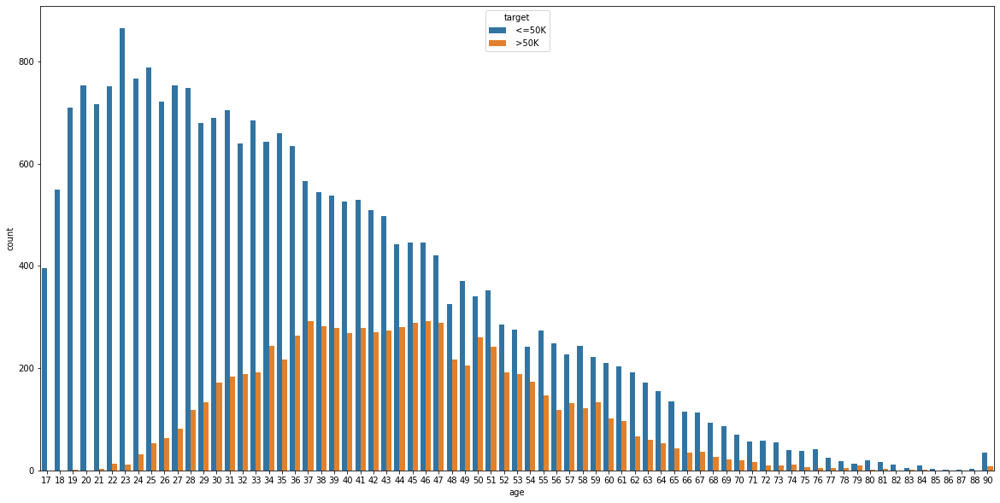

In [8]:
plt.figure(figsize=(20,10))
sns.countplot(x='age', hue='target', data=df_train)
plt.show()

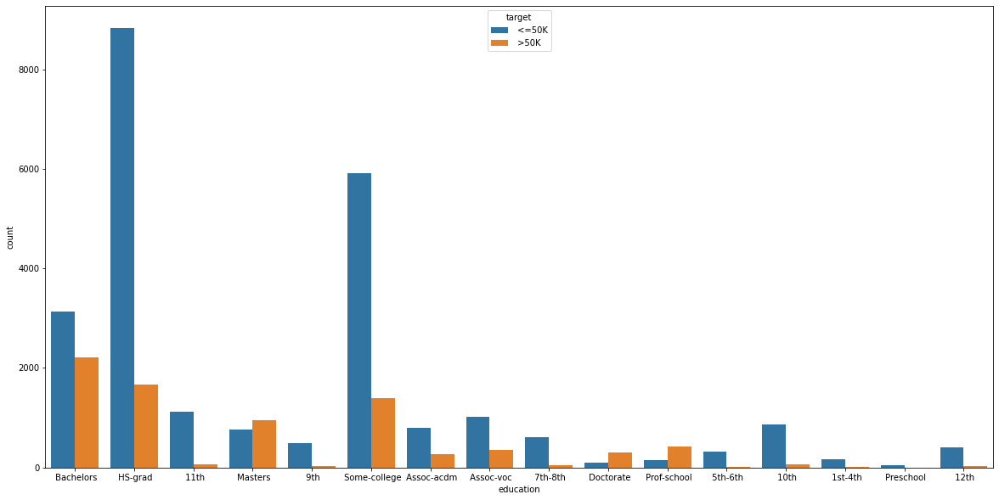

In [9]:
plt.figure(figsize=(20,10))
sns.countplot(x='education', hue='target', data=df_train)
plt.show()

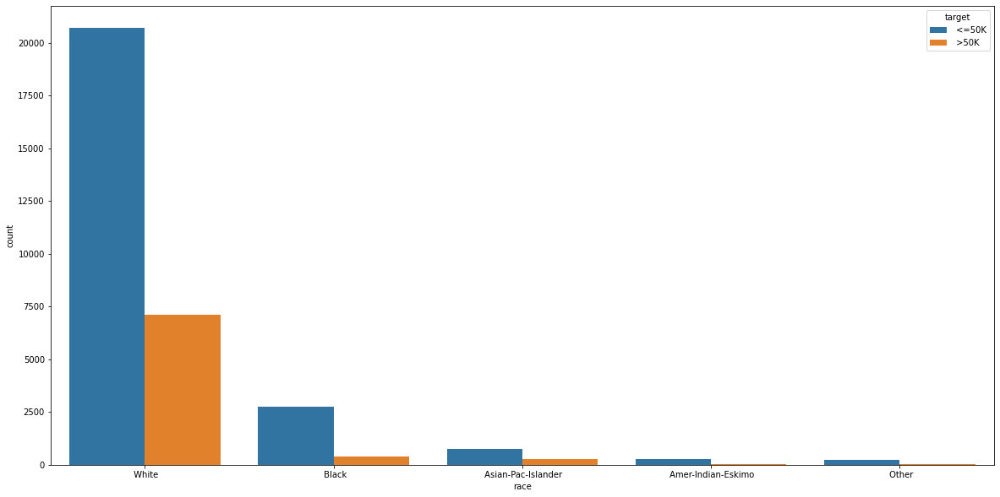

In [10]:
plt.figure(figsize=(20,10))
sns.countplot(x='race', hue='target', data=df_train)
plt.show()

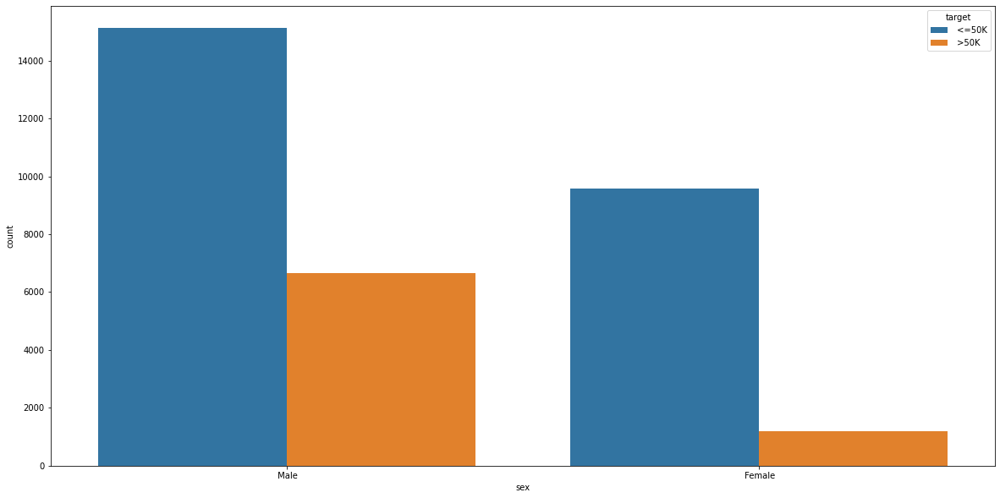

In [11]:
plt.figure(figsize=(20,10))
sns.countplot(x='sex', hue='target', data=df_train)
plt.show()

In [12]:
px.scatter(df_train, x='fnlwgt', y='target')

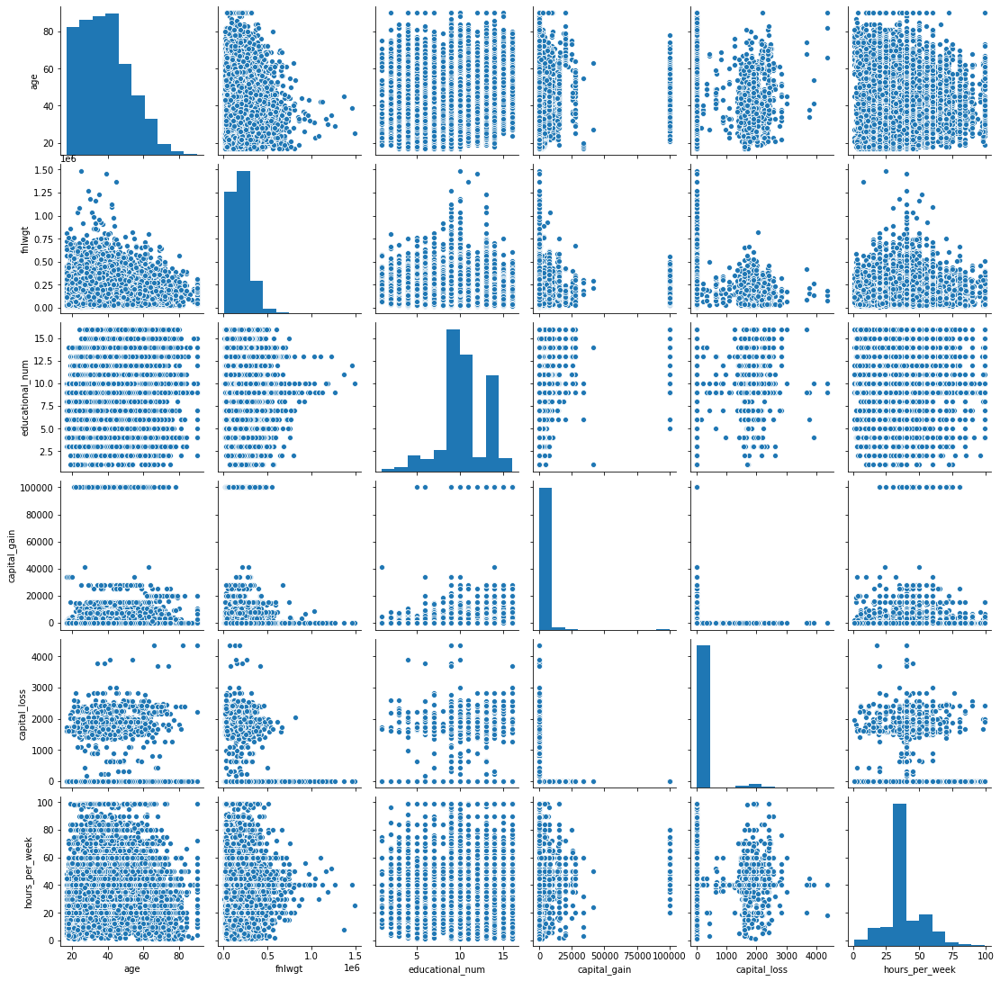

In [13]:
sns.pairplot(df_train)

In [14]:
px.box(df_train, x='hours_per_week')

We will keep the outliers in terms of hours_per_week as some values might seem extreme but are not totally unrealistic (there are 148 hours in a week, so working 100 hours is possible..)

In [15]:
px.box(df_train, x='capital_gain')

In [16]:
px.box(df_train, x='capital_loss')

In [17]:
px.scatter(df_train, x='capital_gain', y='target')

## Clean the dataset

Let's first check the missing values.

In [18]:
df_train.isna().sum()

age                   0
workclass          1836
fnlwgt                0
education             0
educational_num       0
marital_status        0
occupation         1843
relationship          0
race                  0
sex                   0
capital_gain          0
capital_loss          0
hours_per_week        0
native_country      583
target                0
dtype: int64

In [19]:
df_train.groupby('workclass').occupation.value_counts()

workclass          occupation        
 Federal-gov        Adm-clerical          317
                    Exec-managerial       180
                    Prof-specialty        175
                    Tech-support           68
                    Craft-repair           64
                    Other-service          35
                    Protective-serv        28
                    Transport-moving       25
                    Handlers-cleaners      23
                    Machine-op-inspct      14
                    Sales                  14
                    Armed-Forces            9
                    Farming-fishing         8
 Local-gov          Prof-specialty        705
                    Protective-serv       304
                    Adm-clerical          283
                    Exec-managerial       214
                    Other-service         193
                    Craft-repair          146
                    Transport-moving      115
                    Handlers-cleaners     

Those who do not have a workclass do not have an occupation either.

We will remove the corresponding rows as the columns might be important but it is hard to guess the occupation. Although, the unknown occupation we see in 'Never-worked' can be replaced by 'No job'.

In [20]:
df_train.dropna(subset=['workclass'], inplace=True)

In [21]:
df_train.isna().sum()

age                  0
workclass            0
fnlwgt               0
education            0
educational_num      0
marital_status       0
occupation           7
relationship         0
race                 0
sex                  0
capital_gain         0
capital_loss         0
hours_per_week       0
native_country     556
target               0
dtype: int64

In [22]:
df_train.occupation.fillna('No job', inplace=True)

In [23]:
df_train.isna().sum()

age                  0
workclass            0
fnlwgt               0
education            0
educational_num      0
marital_status       0
occupation           0
relationship         0
race                 0
sex                  0
capital_gain         0
capital_loss         0
hours_per_week       0
native_country     556
target               0
dtype: int64

In [24]:
df_train[df_train.native_country.isna()]

,age,workclass,fnlwgt,education,educational_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,target
14,40,Private,121772,Assoc-voc,11,Married-civ-spouse,Craft-repair,Husband,Asian-Pac-Islander,Male,0,0,40,NaN,>50K
38,31,Private,84154,Some-college,10,Married-civ-spouse,Sales,Husband,White,Male,0,0,38,NaN,>50K
51,18,Private,226956,HS-grad,9,Never-married,Other-service,Own-child,White,Female,0,0,30,NaN,<=50K
93,30,Private,117747,HS-grad,9,Married-civ-spouse,Sales,Wife,Asian-Pac-Islander,Female,0,1573,35,NaN,<=50K
245,56,Private,203580,HS-grad,9,Married-civ-spouse,Adm-clerical,Husband,White,Male,0,0,35,NaN,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32413,45,Private,199590,5th-6th,3,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,NaN,<=50K
32449,44,Self-emp-inc,71556,Masters,14,Married-civ-spouse,Sales,Husband,White,Male,0,0,50,NaN,>50K
32469,58,Self-emp-inc,181974,Doctorate,16,Never-married,Prof-specialty,Not-in-family,White,Female,0,0,99,NaN,<=50K
32492,42,Self-emp-not-inc,217597,HS-grad,9,Divorced,Sales,Own-child,White,Male,0,0,50,NaN,<=50K


In [25]:
df_train.native_country.value_counts()

 United-States                 27511
 Mexico                          610
 Philippines                     188
 Germany                         128
 Puerto-Rico                     109
 Canada                          107
 El-Salvador                     100
 India                           100
 Cuba                             92
 England                          86
 Jamaica                          80
 South                            71
 Italy                            68
 China                            68
 Dominican-Republic               67
 Vietnam                          64
 Guatemala                        63
 Japan                            59
 Columbia                         56
 Poland                           56
 Taiwan                           42
 Haiti                            42
 Iran                             42
 Portugal                         34
 Nicaragua                        33
 Peru                             30
 Greece                           29
 

In [26]:
df_train.dropna(subset=['native_country'], inplace=True)

In [27]:
df_train.isna().sum().sum()

0

In [28]:
df_train.shape

(30169, 15)

Let's now check if there are duplicates in the dataset and then check if the data is clean enough.

### Check for duplicates

In [29]:
df_train.duplicated().sum()

23

It seems that we have 24 rows that are duplicates. Let's see them and then eventually remove them.

In [30]:
df_train[df_train.duplicated()]

,age,workclass,fnlwgt,education,educational_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,target
4881,25,Private,308144,Bachelors,13,Never-married,Craft-repair,Not-in-family,White,Male,0,0,40,Mexico,<=50K
5104,90,Private,52386,Some-college,10,Never-married,Other-service,Not-in-family,Asian-Pac-Islander,Male,0,0,35,United-States,<=50K
9171,21,Private,250051,Some-college,10,Never-married,Prof-specialty,Own-child,White,Female,0,0,10,United-States,<=50K
11631,20,Private,107658,Some-college,10,Never-married,Tech-support,Not-in-family,White,Female,0,0,10,United-States,<=50K
13084,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
15059,21,Private,243368,Preschool,1,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,50,Mexico,<=50K
17040,46,Private,173243,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,40,United-States,<=50K
18698,19,Private,97261,HS-grad,9,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,40,United-States,<=50K
21318,19,Private,138153,Some-college,10,Never-married,Adm-clerical,Own-child,White,Female,0,0,10,United-States,<=50K
21490,19,Private,146679,Some-college,10,Never-married,Exec-managerial,Own-child,Black,Male,0,0,30,United-States,<=50K


Fortunately, it is mainly data from the majority class. Let's delete the rows.

In [31]:
df_train.drop_duplicates(inplace=True)

In [32]:
df_train.shape

(30146, 15)

### Check for quality

In [33]:
df_train.workclass.value_counts()

 Private             22264
 Self-emp-not-inc     2498
 Local-gov            2067
 State-gov            1279
 Self-emp-inc         1074
 Federal-gov           943
 Without-pay            14
 Never-worked            7
Name: workclass, dtype: int64

In [34]:
df_train.marital_status.value_counts()

 Married-civ-spouse       14060
 Never-married             9716
 Divorced                  4213
 Separated                  939
 Widowed                    827
 Married-spouse-absent      370
 Married-AF-spouse           21
Name: marital_status, dtype: int64

In [35]:
df_train.relationship.value_counts()

 Husband           12457
 Not-in-family      7715
 Own-child          4467
 Unmarried          3211
 Wife               1407
 Other-relative      889
Name: relationship, dtype: int64

In [36]:
df_train.race.value_counts()

 White                 25917
 Black                  2818
 Asian-Pac-Islander      894
 Amer-Indian-Eskimo      286
 Other                   231
Name: race, dtype: int64

In [37]:
df_train.sex.value_counts()

 Male      20371
 Female     9775
Name: sex, dtype: int64

Ok, the data is clean. Let's deal with the categorical variables.

### Categorical variables

In [38]:
to_dummify = ['workclass', 'education', 'marital_status', 'occupation', 'relationship', 'race', 'native_country']

In [39]:
df_train.target.unique()[0]

' <=50K'

In [40]:
sex_dict = {' Male':0, ' Female':1}
target_dict = {df_train.target.unique()[0]: 1, df_train.target.unique()[1]: 0}

In [41]:
dummified_cols = pd.get_dummies(df_train[to_dummify], drop_first=True)

In [42]:
sex_bin = df_train.sex.map(sex_dict)

In [43]:
sex_bin

0        0
1        0
2        0
3        0
4        1
        ..
32556    1
32557    0
32558    1
32559    0
32560    1
Name: sex, Length: 30146, dtype: int64

In [44]:
target_bin = df_train.target.map(target_dict)

In [45]:
target_bin

0        1
1        1
2        1
3        1
4        1
        ..
32556    1
32557    0
32558    1
32559    1
32560    0
Name: target, Length: 30146, dtype: int64

In [46]:
df_train_clean = pd.concat([df_train, dummified_cols], axis=1)

In [47]:
df_train_clean.sex = df_train.sex.map(sex_dict)
df_train_clean.target = df_train.target.map(target_dict)

In [48]:
df_train_clean.drop(to_dummify, axis = 1, inplace = True)

In [49]:
df_train_clean.columns

Index(['age', 'fnlwgt', 'educational_num', 'sex', 'capital_gain',
       'capital_loss', 'hours_per_week', 'target', 'workclass_ Local-gov',
       'workclass_ Never-worked', 'workclass_ Private',
       'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc',
       'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 11th',
       'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th',
       'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm',
       'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate',
       'education_ HS-grad', 'education_ Masters', 'education_ Preschool',
       'education_ Prof-school', 'education_ Some-college',
       'marital_status_ Married-AF-spouse',
       'marital_status_ Married-civ-spouse',
       'marital_status_ Married-spouse-absent',
       'marital_status_ Never-married', 'marital_status_ Separated',
       'marital_status_ Widowed', 'occupation_ Armed-Forces',
       'occupation_ Craft-repair', 'oc

In [50]:
df_train_clean.target

0        1
1        1
2        1
3        1
4        1
        ..
32556    1
32557    0
32558    1
32559    1
32560    0
Name: target, Length: 30146, dtype: int64

Let's now drop the 'educational_num' column.

In [51]:
df_train_clean.drop('educational_num', axis=1, inplace=True)

### Feature Engineering

In [52]:
df_train_clean['abs_capital_gain'] = df_train_clean['capital_gain'] - df_train_clean['capital_loss']

## Predictions

In [53]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [54]:
X = df_train_clean.drop('target', axis=1)

In [55]:
y = df_train_clean.target

### Create a dataset with only selected features

In [56]:
selected_features = ['age', 'fnlwgt', 'sex', 'capital_gain',
       'capital_loss', 'hours_per_week', 'workclass_ Local-gov',
       'workclass_ Never-worked', 'workclass_ Private',
       'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc',
       'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 11th',
       'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th',
       'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm',
       'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate',
       'education_ HS-grad', 'education_ Masters', 'education_ Preschool',
       'education_ Prof-school', 'education_ Some-college',
       'marital_status_ Married-AF-spouse',
       'marital_status_ Married-civ-spouse',
       'marital_status_ Married-spouse-absent',
       'marital_status_ Never-married', 'marital_status_ Separated',
       'marital_status_ Widowed', 'occupation_ Armed-Forces',
       'occupation_ Craft-repair', 'occupation_ Exec-managerial',
       'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners',
       'occupation_ Machine-op-inspct', 'occupation_ Other-service',
       'occupation_ Priv-house-serv', 'occupation_ Prof-specialty',
       'occupation_ Protective-serv', 'occupation_ Sales',
       'occupation_ Tech-support', 'occupation_ Transport-moving',
       'occupation_No job', 'relationship_ Not-in-family',
       'relationship_ Other-relative', 'relationship_ Own-child',
       'relationship_ Unmarried', 'relationship_ Wife',
       'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race_ White',
       'native_country_ Canada', 'native_country_ China',
       'native_country_ Columbia', 'native_country_ Cuba',
       'native_country_ Dominican-Republic', 'native_country_ Ecuador',
       'native_country_ El-Salvador', 'native_country_ England',
       'native_country_ France', 'native_country_ Germany',
       'native_country_ Greece', 'native_country_ Guatemala',
       'native_country_ Haiti', 'native_country_ Holand-Netherlands',
       'native_country_ Honduras', 'native_country_ Hong',
       'native_country_ Hungary', 'native_country_ India',
       'native_country_ Iran', 'native_country_ Ireland',
       'native_country_ Italy', 'native_country_ Jamaica',
       'native_country_ Japan', 'native_country_ Laos',
       'native_country_ Mexico', 'native_country_ Nicaragua',
       'native_country_ Outlying-US(Guam-USVI-etc)', 'native_country_ Peru',
       'native_country_ Philippines', 'native_country_ Poland',
       'native_country_ Portugal', 'native_country_ Puerto-Rico',
       'native_country_ Scotland', 'native_country_ South',
       'native_country_ Taiwan', 'native_country_ Thailand',
       'native_country_ Trinadad&Tobago', 'native_country_ United-States',
       'native_country_ Vietnam', 'native_country_ Yugoslavia']

In [57]:
X_red = X[selected_features]

### Split the dataset into train and test sets

In [58]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_red, y, test_size=.2, random_state=42, stratify=y)

### Instantiate the models

In [59]:
dt = DecisionTreeClassifier(random_state=42)
rf = RandomForestClassifier(random_state=42)

In [60]:
dt.fit(X_train, y_train)
dt.score(X_test, y_test)

0.805804311774461

In [61]:
dt.score(X_train, y_train)

1.0

The model here is overfitting.

In [62]:
rf.fit(X_train, y_train)
rf.score(X_test, y_test)

0.8512437810945274

In [63]:
rf.score(X_train, y_train)

1.0

The random forest is overfitting too. Let's see the feature importance and then select only some features.

In [64]:
sort_features_dt = np.argsort(-dt.feature_importances_)
sort_features_rf = np.argsort(-rf.feature_importances_)

X_red.columns[sort_features_dt][:10]

Index(['marital_status_ Married-civ-spouse', 'fnlwgt', 'capital_gain', 'age',
       'hours_per_week', 'capital_loss', 'education_ Bachelors',
       'education_ Masters', 'occupation_ Prof-specialty',
       'occupation_ Exec-managerial'],
      dtype='object')

In [65]:
X_red.columns[sort_features_rf][:10]

Index(['fnlwgt', 'age', 'capital_gain', 'hours_per_week',
       'marital_status_ Married-civ-spouse', 'marital_status_ Never-married',
       'capital_loss', 'education_ Bachelors', 'occupation_ Exec-managerial',
       'occupation_ Prof-specialty'],
      dtype='object')

Let's check the correlation matrix with the target.

In [66]:
abs(df_train_clean.corr()['target']).sort_values(ascending=False)[:20]

target                                1.000000
marital_status_ Married-civ-spouse    0.445351
marital_status_ Never-married         0.319933
age                                   0.242134
hours_per_week                        0.229500
relationship_ Own-child               0.226333
capital_gain                          0.221214
sex                                   0.216625
occupation_ Exec-managerial           0.213508
abs_capital_gain                      0.212334
relationship_ Not-in-family           0.193008
occupation_ Prof-specialty            0.181513
education_ Bachelors                  0.178951
education_ Masters                    0.174258
occupation_ Other-service             0.165904
education_ Prof-school                0.156480
capital_loss                          0.150049
relationship_ Unmarried               0.145840
workclass_ Self-emp-inc               0.137642
education_ HS-grad                    0.136262
Name: target, dtype: float64

We can see a lot of similitude with all these results. Let's select those features :

In [67]:
selected_features = ['age', 'fnlwgt', 'sex', 'capital_gain',
       'capital_loss', 'hours_per_week', 'education_ Bachelors','education_ Masters',
       'marital_status_ Married-civ-spouse',
       'marital_status_ Never-married', 'occupation_ Exec-managerial',
       'occupation_ Prof-specialty']

In [68]:
X_red = X[selected_features]

In [69]:
X_train, X_test, y_train, y_test = train_test_split(X_red, y, test_size=.2, random_state=42, stratify=y)

In [70]:
dt.fit(X_train, y_train)
dt.score(X_test, y_test)

0.7961857379767827

In [71]:
dt.score(X_train, y_train)

0.9988389450986896

In [72]:
rf.fit(X_train, y_train)
rf.score(X_test, y_test)

0.8333333333333334

In [73]:
rf.score(X_train, y_train)

0.9988389450986896

It is still overfitting a bit. Let's tweak the hyperparameters. We can for instance try to increase min_samples_leaf or min_samples_split or even constrain max_depth so it does not go too high.

In [74]:
from sklearn.model_selection import GridSearchCV

In [75]:
param_grid = {'max_depth': np.arange(10,16), 'min_samples_leaf': [1, 10, 100], 'min_samples_split': [0.001, 0.01]}

In [76]:
dt_grid = GridSearchCV(dt, param_grid=param_grid)
#rf_grid = GridSearchCV(rf, param_grid=param_grid)

In [77]:
dt_grid.fit(X_train, y_train)

GridSearchCV(estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'max_depth': array([10, 11, 12, 13, 14, 15]),
                         'min_samples_leaf': [1, 10, 100],
                         'min_samples_split': [0.001, 0.01]})

In [78]:
#rf_grid.fit(X_train, y_train)

In [79]:
dt_best = dt_grid.best_estimator_
#rf_best = rf_grid.best_estimator_

In [80]:
dt_grid.best_params_

{'max_depth': 10, 'min_samples_leaf': 10, 'min_samples_split': 0.01}

In [81]:
#rf_grid.best_params_

In [82]:
#rf_best.score(X_test, y_test)

In [83]:
#rf_best.score(X_train, y_train)

In [84]:
param_grid = {'max_depth': np.arange(10,16), 'min_samples_leaf': [1, 2, 3], 'min_samples_split': [0.0001, 0.001]}

In [85]:
rf_grid = GridSearchCV(rf, param_grid=param_grid)

In [86]:
rf_grid.fit(X_train, y_train)

GridSearchCV(estimator=RandomForestClassifier(random_state=42),
             param_grid={'max_depth': array([10, 11, 12, 13, 14, 15]),
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [0.0001, 0.001]})

In [87]:
rf_grid.best_params_

{'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 0.001}

In [88]:
rf_best = rf_grid.best_estimator_

In [89]:
rf_best.score(X_test, y_test)

0.8543946932006633

In [90]:
rf_best.score(X_train, y_train)

0.8713717034334052

In [93]:
from sklearn.tree import export_graphviz
import graphviz
import pydotplus

# We export the tree in graphviz format 
dot_data = export_graphviz(dt_best,
                           out_file=None,
                           feature_names=X_red.columns,  
                           filled=True, rounded=True)

# We load the tree again with graphviz library in order to display it
pydot_graph = pydotplus.graph_from_dot_data(dot_data)
pydot_graph.set_size('"10,8!"')
graph = graphviz.Source(pydot_graph.to_string())
graph

ExecutableNotFound: failed to execute ['dot', '-Tsvg'], make sure the Graphviz executables are on your systems' PATH